In [1]:
import itertools
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import random
import cvxpy as cp
from numpy import linalg as LA
import pprint
from lap import lapjv
import copy
import pandas as pd
from matplotlib import cm
from colorspacious import cspace_converter
from collections import OrderedDict
from itertools import permutations  
from networkx.algorithms import bipartite
from networkx.utils import pairwise

[0, 1, 2, 3, 4, 5, 6, 7]


'\n1 dark blue\n2 light green\n3 dark green\n4 pink\n5 red\n6 yellow \n7 orange\n8 light purple\n9 dark purple\n'

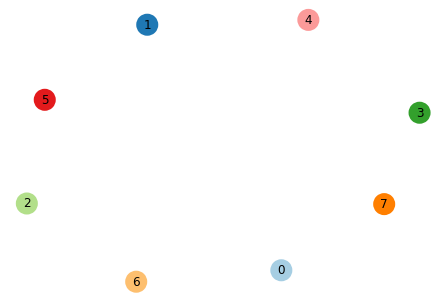

In [2]:
# Color diagram
mg_check_color = nx.MultiGraph()
temp = [i for i in range(8)]
print(temp)
mg_check_color.add_nodes_from(temp)
colors = plt.get_cmap('Paired').colors
options = {
    "node_color": [colors[i] for i in temp],
    "node_size": 290,
    "edge_color": "grey",
    "linewidths": 5,
    "width": 0.3,
}
nx.draw(mg_check_color, pos=nx.spring_layout(mg_check_color),with_labels = True, **options)
#plt.show()
"""
1 dark blue
2 light green
3 dark green
4 pink
5 red
6 yellow 
7 orange
8 light purple
9 dark purple
"""

In [3]:
interests = ["stroll", "physical exercise", "picnic", "reading", "game", "photography",
             "sit and rest", "chat with friends", "view", "parents-child campaign"]
occupations = ["civil servant", "public institution", "enterprise", "privately-operated", "freelancer",
       "wait for employment", "student", "other"]

In [4]:
occ_data = pd.read_excel(r'DataSets/shangnan_occ.xlsx')
int_data = pd.read_excel(r'DataSets/shangnan_interest.xlsx')



In [5]:
def occd_n_occod(occ_data):
    #get the indices of the selected choices of each survay sample
    occ_d = dict()
    for i in range(len(occ_data.values)):
        l = []
        for j in range(len(occ_data.values[0])):
            if occ_data.values[i][j] == 1:
                l.append(j)
        occ_d[i] = l

    occ_od = dict((k, []) for k in range(len(occ_data.values[0])))
    for i in range(len(occ_data.values)):
        for j in range(len(occ_data.values[0])):
            if occ_data.values[i][j] == 1:
                occ_od[j].append(i)

    for k in occ_od.keys():
        occ_od[k] = list(permutations(occ_od[k], 2))
        
    return occ_d, occ_od

In [6]:
def intd(int_data):
    int_d = dict()
    for i in range(len(int_data.values)):
        l = []
        for j in range(len(int_data.values[0])):
            if int_data.values[i][j] == 1:
                l.append(j)
        int_d[i] = l
    
    return int_d

In [7]:
def multilayered_graph(*subset_sizes):
    
    person = list(occ_d.keys())
    extents = pairwise(itertools.accumulate((0,) + subset_sizes))
    layers = [range(start, end) for start, end in extents]
    G = nx.Graph()
    G.add_nodes_from(occupations, layer=0)
    G.add_nodes_from(person, layer=1)
    G.add_nodes_from(interests, layer=2)

    for i in range(len(person)):
        if (len(occ_d[person[i]]) > 0):
            for k in occ_d[person[i]]:
                G.add_edges_from([(person[i], occupations[k])])
        if (len(int_d[person[i]]) > 0):
            for j in int_d[person[i]]:
                G.add_edges_from([(person[i], interests[j])])
    return G





Plot Tripartite graph


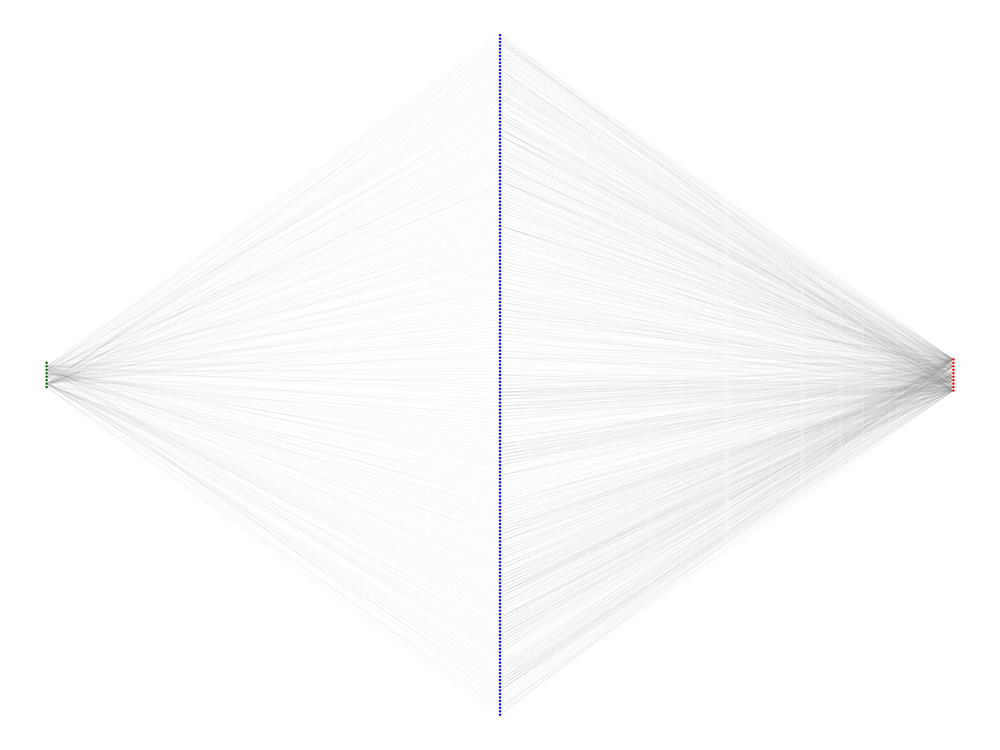

In [8]:
occ_d = occd_n_occod(occ_data)[0]
int_d = intd(int_data)

person = list(occ_d.keys())
subset_sizes = [8, len(person), 10]
subset_color = ["darkgreen", "blue", "red"]

options = {
"node_size": 180,
"edge_color": "grey",
"linewidths": 0.5,
"width": 0.3,
}

print("Plot Tripartite graph")

G = multilayered_graph(*subset_sizes)
color = [subset_color[data["layer"]] for v, data in G.nodes(data=True)]
pos = nx.multipartite_layout(G, subset_key="layer", scale=2)
plt.figure(figsize=(80, 60))
nx.draw(G, pos, node_color=color, with_labels=False, **options)
plt.show()



In [9]:
def node_color_n_link_occ(occ_d,occ_od):
    #create an undirected multi-graph whose nodes represent each survay sample
    mg = nx.MultiGraph()
    mg.add_nodes_from(occ_d.keys())

    #create a list of colors for each option
    opt_cols = ['r' for i in range(10)]

    #add edges to the nodes that both select the options
    for k in occ_od.keys():
        mg.add_edges_from(occ_od[k])

    colors = plt.get_cmap('Paired').colors

    degree = np.array(nx.degree(mg))

    degree_list = []
    for i in range(len(degree)):
        degree_list.append((degree[i][1] - np.mean(degree) )*25)

    color_list = []
    for v in occ_d.values():
        try:
            v= np.array(v)
            color_list.append(v[0])
        except:
            color_list.append(-1)

    options = {
        "node_color": [colors[i] for i in color_list],
        "node_size": 40,
        "edge_color": "grey",
        "linewidths": 0,
        "width": 0.3,
    }
    nx.draw(mg, pos=nx.random_layout(mg), **options)
    plt.show()
    #点的颜色和连线都是occ
    # 有#occ个subgraph 每一个都 fully connected
    
    return mg


    

In [10]:

def non_bipar_interest_person(int_d):
    person = list(int_d.keys())

    B = nx.Graph()
    B.add_nodes_from(person, bipartite=0)
    B.add_nodes_from(interests, bipartite=1)

    for i in range(len(person)):
        for j in int_d[person[i]]:
            B.add_edges_from([(person[i], interests[j])])

    c = bipartite.color(B)
    nx.set_node_attributes(B, c, "bipartite")
    colors = ["red", "blue"]
    # print(c)
    color_list =['blue' for i in range(len(person))] + ['red' for i in range(len(interests))]
    options = {
        "node_color": color_list,
        "node_size": 40,
        "edge_color": "grey",
        "linewidths": 0,
        "width": 0.3,
    }

    # top = nx.bipartite.sets(B)[0]
    # nx.draw(B, pos=nx.bipartite_layout(B, top), **options)

    nx.draw(B, pos=nx.random_layout(B), **options)
    plt.show()
    
    return B

In [11]:
def bipar_interest_person(int_d):
    person = list(int_d.keys())
    B = nx.Graph()
    B.add_nodes_from(person, bipartite=0)
    B.add_nodes_from(interests, bipartite=1)

    for i in range(len(person)):
        for j in int_d[person[i]]:
            B.add_edges_from([(person[i], interests[j])])

    remove = [node for node,degree in dict(B.degree()).items() if degree == 0]
    B.remove_nodes_from(remove)

    c = bipartite.color(B)
    nx.set_node_attributes(B, c, "bipartite")
    colors = ["red", "blue"]

    options = {
        "node_size": 20,
        "edge_color": "grey",
        "linewidths": 0.1,
        "width": 0.3,
    }

    top = nx.bipartite.sets(B)[0]
    bottom = nx.bipartite.sets(B)[1]

    color_list =['blue' for i in range(len(person) - len(remove))] + ['red' for i in range(len(interests))]
    plt.figure(figsize=(10, 5))
    nx.draw(B, pos=nx.bipartite_layout(B, top), node_color=color_list, **options)
    plt.show()
    return B

In [12]:
def non_bipar_occ_person(occ_d):
    person = list(occ_d.keys())
    B_1 = nx.Graph()
    B_1.add_nodes_from(person, bipartite=0)
    B_1.add_nodes_from(occupations, bipartite=1)

    for i in range(len(person)):
        for j in occ_d[person[i]]:
            B_1.add_edges_from([(person[i], occupations[j])])

    c = bipartite.color(B_1)
    nx.set_node_attributes(B_1, c, "bipartite")
    colors = ["red", "cornflowerblue"]
    # print(c)
    color_list =['cornflowerblue' for i in range(len(person))] + ['red' for i in range(len(occupations))]
    options = {
    #     "node_color": [colors[i] for i in color_list],
        "node_color": color_list,
        "node_size": 40,
        "edge_color": "grey",
        "linewidths": 0,
        "width": 0.3,
    }

    # top = nx.bipartite.sets(B)[0]
    # nx.draw(B, pos=nx.bipartite_layout(B, top), **options)

    nx.draw(B_1, pos=nx.random_layout(B_1), **options)
    plt.show()
    
    return B_1

In [13]:
def color_occ_links_sharing_interest(occ_d,int_d):
    # multigraph node color represent occ and links represent there are more than two number of 
    # links between each other

    mg = nx.MultiGraph()
    mg.add_nodes_from(occ_d.keys())
    l_link = list(occ_d.keys())

    #create a list of colors for each option
    opt_cols = ['r' for i in range(10)]

    #add edges to the nodes that select more than two same options
    for i in range(len(int_d)):
        for j in range(i+1,len(int_d)):
            if len(set(int_d[i]) & set(int_d[j])) > 2:
                mg.add_edges_from([(l_link[i],l_link[j])])




    colors = plt.get_cmap('Paired').colors


    degree = np.array(nx.degree(mg))


    degree_list = []
    for i in range(len(degree)):
        degree_list.append((degree[i][1] - np.mean(degree) )*25)

    color_list = []
    for v in occ_d.values():
        try:
            v= np.array(v)
            color_list.append(v[0])
        except:
            color_list.append(-1)

    options = {
        "node_color": [colors[i] for i in color_list],
        "node_size": 40,
        "edge_color": "grey",
        "linewidths": 0,
        "width": 0.3,
    }
    nx.draw(mg, pos=nx.random_layout(mg), **options)
    plt.show()
    plt.close()
    return mg


In [14]:
def shared_int_weighted(occ_d,int_d):
    # multigraph node color represent occ and links represent there are more than two number of 
    # links between each other

    mg = nx.Graph()
    mg.add_nodes_from(occ_d.keys())
    l_link = list(occ_d.keys())

    #create a list of colors for each option
    opt_cols = ['r' for i in range(10)]

    #add weighted edges to the nodes that select the same options
    for i in range(len(int_d)):
        for j in range(i+1,len(int_d)):
            lw = len(set(int_d[i]) & set(int_d[j]))
            if (lw > 0):
                mg.add_weighted_edges_from([(l_link[i],l_link[j], lw/5)])




    colors = plt.get_cmap('Paired').colors


    degree = np.array(nx.degree(mg))
    #print(degree)
    #print(type(d[1][1]))


    degree_list = []
    for i in range(len(degree)):
        degree_list.append((degree[i][1] - np.mean(degree) )*25)

    #print(degree_list)

    color_list = []
    for v in occ_d.values():
        try:
            v= np.array(v)
            color_list.append(v[0])
        except:
            color_list.append(-1)
            
    edges,weights = zip(*nx.get_edge_attributes(mg,'weight').items())

    options = {
        "node_color": [colors[i] for i in color_list],
        "node_size": 40,
#         "edge_color": "grey",
        "width": [w for w in nx.get_edge_attributes(mg,'weight').values()]
    }
    nx.draw(mg, pos=nx.random_layout(mg), edgelist=edges, edge_color=weights, edge_cmap=plt.cm.Greys, **options)
#     plt.figure(figsize=(300, 300))
#     plt.show()
    plt.show()
    plt.close()

    """
    1 dark blue
    2 light green
    3 dark green
    4 pink
    5 red
    6 yellow 
    7 orange
    """
    
    return mg

In [15]:
def draw_degree_dist(G, nbins, ax, label, log = True, norm = False):
    deg = np.array([degree for (node, degree) in G.degree(weight='weight')])
    max_in = max(deg)
    min_in = min(deg)
    print(f'degree of {label}: {[min_in, np.mean(deg), max_in]}')
    nbins = 20
    binrange = np.exp(np.linspace(np.log(min_in+1), np.log(max_in+1), nbins)) -1
        
    bincount, binrange, _ = ax.hist(deg, log = log, bins = binrange, alpha = 0.5, label = label, density = norm)
    if log:
        ax.set_xscale('log')
        
    return bincount, binrange

In [16]:
def degree_dist_plot_frequency(m5,m6):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    nbins = 20
    
    # Plot 1
    draw_degree_dist(m5, nbins, ax, 'Shared Interests')
    draw_degree_dist(m6, nbins, ax, 'Weighted Shared Interests')

    ax.legend()
    ax.set_xlim(1e-1)
    plt.show()
    plt.close()
    return
    
    
def degree_dist_plot_interest_dist(m2):   
    # Plot 2
    int_dist = {}
    
    for i in np.array(m2.degree)[-10:]:
        int_dist[i[0]] = int(i[1])

    int_dist = {k: v for k, v in sorted(int_dist.items(), key = lambda item: item[1])}

    plt.bar(int_dist.keys(),int_dist.values())

    plt.xticks(np.arange(10), ["\n".join([key[i:i+6] for i in range(0, len(key), 6)]) for key in int_dist.keys()], rotation=30, ha='center', va='top', size=8, wrap=True)
    #plt.xticks(np.arange(10), list(int_dist.keys()), rotation=90, ha='center', va='top', size=8, wrap=True)
    plt.title('Interests Distribution')
    plt.show()
    plt.close()
    return
    
def degree_dist_plot_occupation_dist(m4): 
    occ_dist = {}
    for i in np.array(m4.degree)[-8:]:
        occ_dist[i[0]] = int(i[1])

    occ_dist = {k: v for k, v in sorted(occ_dist.items(), key = lambda item: item[1])}

    plt.bar(occ_dist.keys(),occ_dist.values())

    
    plt.xticks(np.arange(8), ["\n".join([key[i:i+6] for i in range(0, len(key), 6)]) for key in occ_dist.keys()], rotation=30, ha='center', va='top', size=8, wrap=True)
    #plt.xticks(np.arange(8), list(occ_dist.keys()), rotation=90, ha='center', va='top', size=8, wrap=True)
    plt.title('Occupation Distribution')
    plt.show()
    plt.close()
    return


def plot_3_dist(m2,m3,m4,m5,m6):

    degree_dist_plot_interest_dist(m2)
    degree_dist_plot_occupation_dist(m4)
    degree_dist_plot_frequency(m5,m6)
    return
    

In [17]:

def main_func(occ_data,int_data):
    occ_data = occ_data.fillna("0")
    int_data = int_data.fillna("0")
    # Plot graph with node color showing occ and links sharing the same occ
    #print("Plot graph with node color showing occ and links sharing the same occ:")
    #m1 = node_color_n_link_occ(occd_n_occod(occ_data)[0],occd_n_occod(occ_data)[1])
    # Plot non bipartite for interest and interviewee
    print("Plot non bipartite for interest and interviewee:")
    m2 = non_bipar_interest_person(intd(int_data))
    # Plot bipartite for interest and interviewee
    print("Plot bipartite for interest and interviewee:")
    m3 = bipar_interest_person(intd(int_data))
    # Plot non bipartite for occ and interviewee
    print(m3.degree)
    print("Plot non bipartite for occupation and interviewee:")
    m4 = non_bipar_occ_person(occd_n_occod(occ_data)[0])
    # Plot graph with node color showing occ and links sharing more than 2 interest 
    print("Plot graph with node color showing occupation and links sharing more than 2 interest:")
    m5 = color_occ_links_sharing_interest(occd_n_occod(occ_data)[0],intd(int_data))
    # Plot graph with node color showing occ and links sharing more than 2 interest 
    print("Plot graph with node color showing occupation and weighted links if there are shared interests:")
    m6 = shared_int_weighted(occd_n_occod(occ_data)[0],intd(int_data))
    # Plot degree dist
    plot_3_dist(m2,m3,m4,m5,m6)
    
    return m2,m3,m4,m5,m6


Plot non bipartite for interest and interviewee:


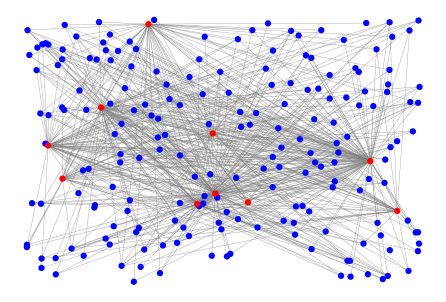

Plot bipartite for interest and interviewee:


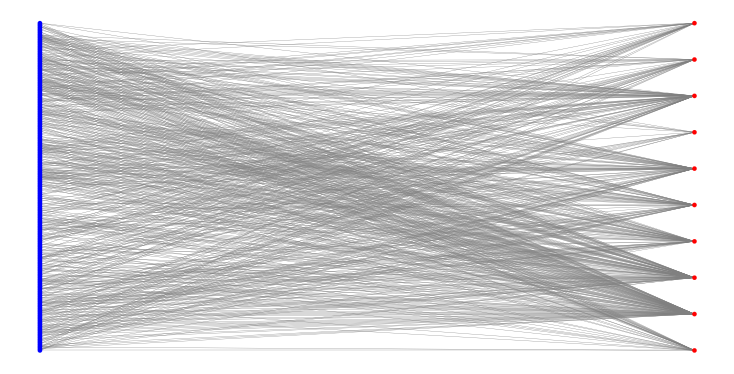

[(0, 3), (1, 5), (2, 6), (3, 2), (4, 3), (5, 1), (6, 3), (7, 2), (8, 3), (9, 1), (10, 5), (11, 4), (12, 3), (13, 3), (14, 4), (15, 3), (16, 1), (17, 4), (18, 4), (19, 1), (20, 3), (22, 3), (23, 4), (24, 5), (25, 3), (26, 1), (27, 7), (28, 1), (29, 7), (30, 1), (31, 3), (32, 2), (33, 4), (34, 3), (35, 3), (36, 1), (37, 5), (38, 4), (39, 2), (40, 2), (41, 3), (42, 7), (43, 2), (44, 2), (45, 3), (46, 2), (47, 3), (48, 2), (49, 3), (50, 3), (51, 3), (52, 1), (53, 2), (54, 2), (55, 7), (56, 1), (57, 3), (58, 2), (59, 3), (60, 1), (61, 2), (62, 2), (63, 2), (64, 2), (65, 3), (66, 2), (67, 3), (68, 3), (69, 1), (70, 2), (71, 3), (73, 3), (74, 3), (75, 3), (76, 2), (77, 4), (78, 1), (79, 4), (80, 2), (81, 3), (82, 2), (83, 2), (84, 3), (85, 2), (86, 3), (87, 1), (88, 2), (89, 1), (90, 1), (91, 3), (92, 2), (93, 4), (94, 1), (95, 1), (96, 1), (97, 1), (98, 4), (99, 3), (100, 2), (101, 3), (102, 4), (103, 7), (104, 6), (105, 5), (106, 3), (107, 6), (108, 5), (109, 3), (110, 3), (111, 3), (113, 2

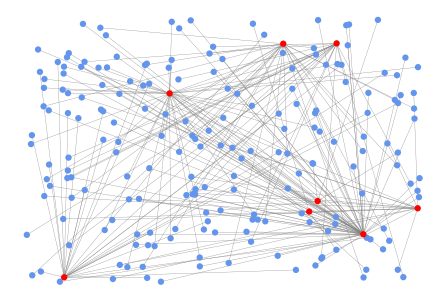

Plot graph with node color showing occupation and links sharing more than 2 interest:


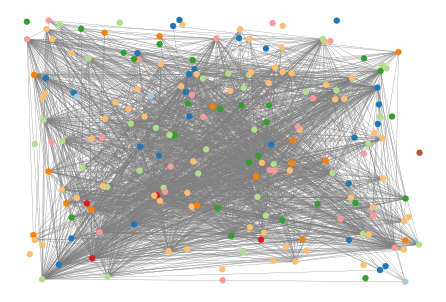

Plot graph with node color showing occupation and weighted links if there are shared interests:


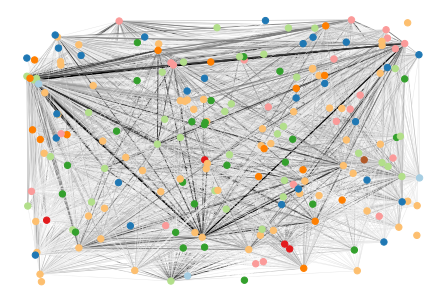

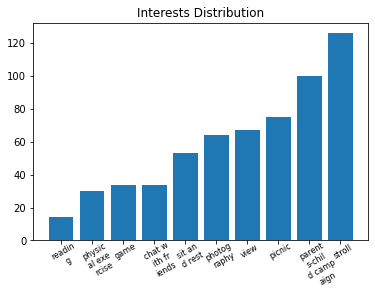

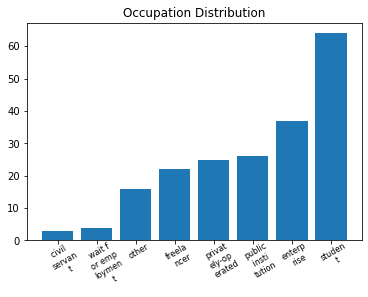

degree of Shared Interests: [0, 22.578680203045685, 101]
degree of Weighted Shared Interests: [0.0, 46.40203045685278, 108.2]


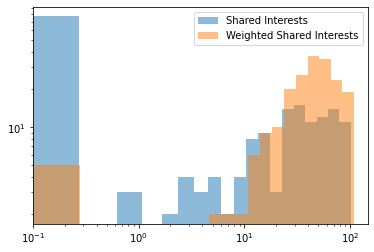

(<networkx.classes.graph.Graph at 0x1225fd460>,
 <networkx.classes.graph.Graph at 0x12e8b7130>)

In [18]:
main_func(occ_data,int_data)

Plot non bipartite for interest and interviewee:


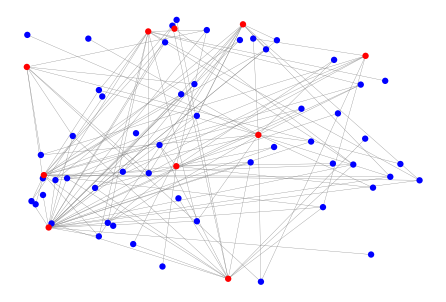

Plot bipartite for interest and interviewee:


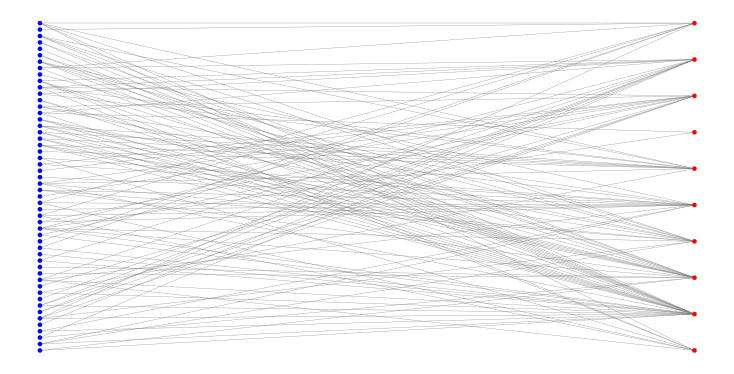

[(0, 2), (1, 3), (2, 2), (3, 2), (4, 1), (5, 4), (6, 2), (7, 3), (8, 1), (9, 2), (10, 1), (11, 4), (12, 1), (13, 1), (14, 2), (15, 1), (16, 2), (17, 1), (18, 2), (19, 5), (20, 2), (21, 3), (22, 1), (23, 3), (24, 1), (27, 3), (28, 4), (29, 1), (30, 1), (31, 2), (32, 2), (33, 1), (34, 4), (35, 3), (36, 3), (37, 4), (38, 3), (39, 3), (40, 3), (41, 2), (42, 2), (43, 4), (44, 4), (45, 1), (46, 3), (47, 4), (48, 2), (49, 1), (50, 2), (51, 4), (52, 1), (53, 5), ('stroll', 28), ('physical exercise', 13), ('picnic', 12), ('reading', 2), ('game', 7), ('photography', 12), ('sit and rest', 11), ('chat with friends', 8), ('view', 14), ('parents-child campaign', 17)]
Plot non bipartite for occupation and interviewee:


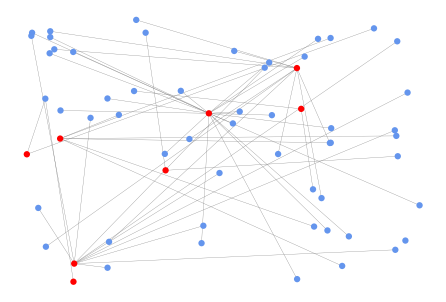

Plot graph with node color showing occupation and links sharing more than 2 interest:


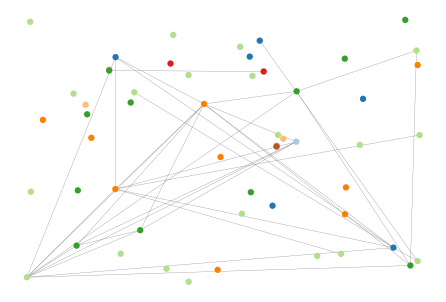

Plot graph with node color showing occupation and weighted links if there are shared interests:


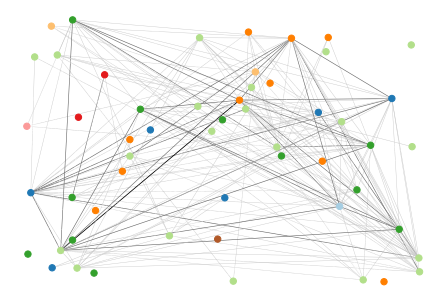

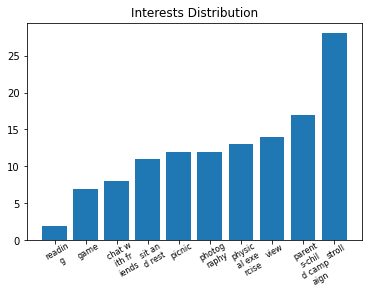

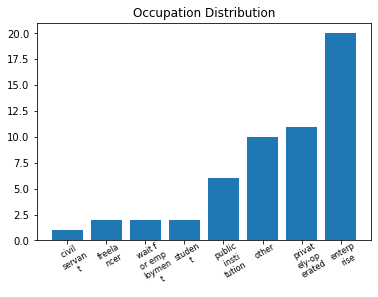

degree of Shared Interests: [0, 1.2222222222222223, 9]
degree of Weighted Shared Interests: [0.0, 6.814814814814816, 13.4]


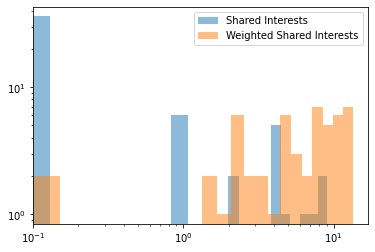

0
Plot non bipartite for interest and interviewee:


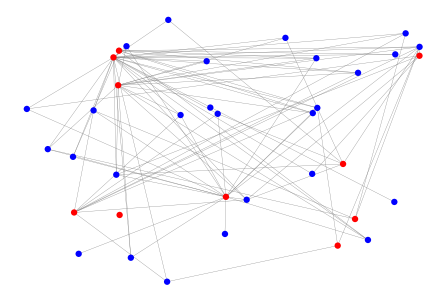

Plot bipartite for interest and interviewee:


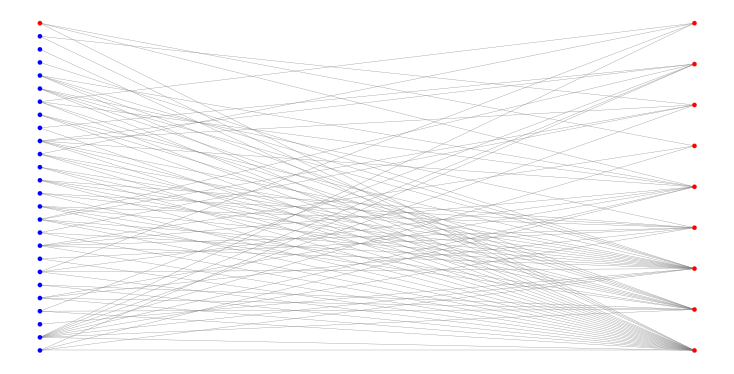

[(0, 4), (1, 9), (2, 1), (3, 3), (4, 4), (5, 2), (6, 4), (7, 2), (8, 5), (9, 3), (10, 5), (11, 4), (12, 3), (13, 4), (14, 3), (15, 4), (17, 6), (18, 2), (19, 3), (20, 4), (21, 4), (22, 4), (23, 1), (24, 1), (25, 2), (26, 3), ('stroll', 24), ('physical exercise', 4), ('picnic', 5), ('reading', 3), ('photography', 17), ('sit and rest', 9), ('chat with friends', 6), ('view', 8), ('parents-child campaign', 14)]
Plot non bipartite for occupation and interviewee:


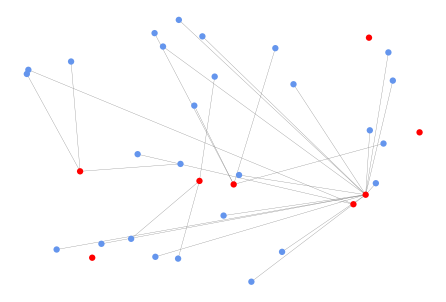

Plot graph with node color showing occupation and links sharing more than 2 interest:


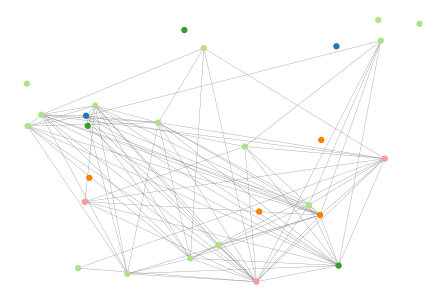

Plot graph with node color showing occupation and weighted links if there are shared interests:


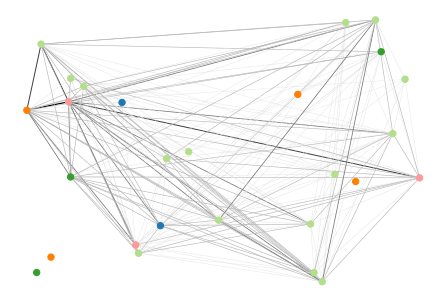

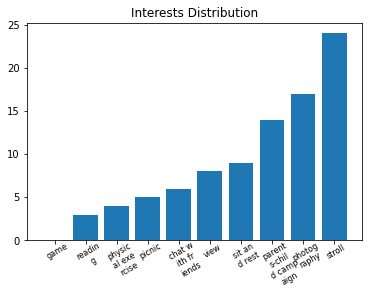

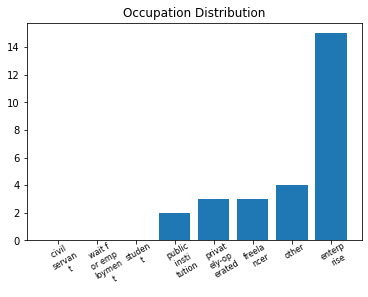

degree of Shared Interests: [0, 6.518518518518518, 18]
degree of Weighted Shared Interests: [0.0, 8.903703703703702, 16.200000000000003]


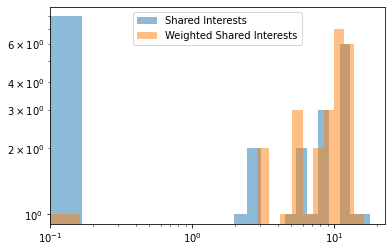

1


In [19]:
occ_data_list = []
occ_data_list.append(pd.read_excel(r'DataSets/BotanicalGarden_occ.xlsx'))
occ_data_list.append(pd.read_excel(r'DataSets/SculpturePark_occ.xlsx'))
int_data_list =[]
int_data_list.append(pd.read_excel(r'DataSets/BotanicalGarden_interest.xlsx'))
int_data_list.append(pd.read_excel(r'DataSets/SculpturePark_interest.xlsx'))

for i in range(len(occ_data_list)):
    main_func(occ_data_list[i],int_data_list[i])
    
    print(i)